## Dark frame analyses on NIRcam & 1/f noise, pt. I: data exploration 
**Author**: Néstor Espinoza (nespinoza@stsci.edu) | **Latest update**: Mar 23, 2021

### Introduction

This notebook is intended to reproduce Figure 4 on  <a href="https://ui.adsabs.harvard.edu/abs/2020AJ....160..231S/abstract">Schlawin et al. (2020)</a>, namely, the (average) power spectral density of amplifier 2 in the NIRCam detector using the `RAPID` readout mode. Everett Schlawin has been kind enough to share the same dark data they used on their paper, so we could have a look at it and reproduce the results. The motivation for us doing it has to do with some JWST Time-Series Observations Working Group work we are doing at STScI, but it might be illustrative to other folks doing similar analyses in other contexts as well. 

It is important to note that Everett had his own set of codes to do a similar analysis <a href="https://github.com/eas342/simple_1_over_f_investigation">here</a> and <a href="https://github.com/eas342/pixeltime">here</a> --- but I found out about those codes later in the writing of this notebook (when comparing notes with him --- which was very useful!). Nonetheless, I think this notebook might be a straightforward illustrative example of how to perform these kind of analyses.

All right, let's start by loading some libraries:

In [1]:
import numpy as np
import glob
import matplotlib.pyplot as plt
from scipy.signal import medfilt
from IPython.display import HTML

from astropy.stats import LombScargle
from astropy.io import fits

# This library helps making animated images:
from celluloid import Camera

### 1. Initial checks and pre-processing

Let's extract all the filenames for NIRCam groups (courtesy of Everett Schlawin!):

In [2]:
files = glob.glob('data/*.fits')
# Order the list:
files.sort()

For pure double-checking purposes, check the very first file `fits` info:

In [3]:
d = fits.open(files[0])
print(d.info())

Filename: data/NRCNRCALONG-DARK-72350742131_1_485_SE_2017-08-23T16h49m51.red_grp_0000.fits
No.    Name      Ver    Type      Cards   Dimensions   Format
  0  PRIMARY       1 PrimaryHDU    1493   (2048, 2048)   float32   
None


All right, dimension is `(2048 x 2048)`. Remember that this is a 4-amplifier detector; we'll deal with all of them first, and then just work with amplifier 2, which is the one on the paper. 

Let's load all the images into a cube --- making sure to substract the median flux of each group (in case they have group-to-group flux variations by, e.g., overall temperature fluctuations perhaps?):

In [4]:
# Define data cube that will store the images. First dimension is the number of groups (files), 
# second and third are the spatial dimensions of the image:
data_cube = np.zeros([len(files), 2048, 2048])

# Iterate through all of them; load them, and substract the median flux from the entire image 
# to remove group-to-group overall flux variations:
for i in range(len(files)):
    d = fits.open(files[i])
    data_cube[i, :, :] = d['PRIMARY'].data - np.median(d['PRIMARY'].data)

Now, let's calculate the median of all groups and substract that to each group following <a href="https://ui.adsabs.harvard.edu/abs/2020AJ....160..231S/abstract">Schlawin et al. (2020)</a>. This effectively should remove the bias variations _accross_ the image which are common to all groups. 

First, calculate (and plot) group median:

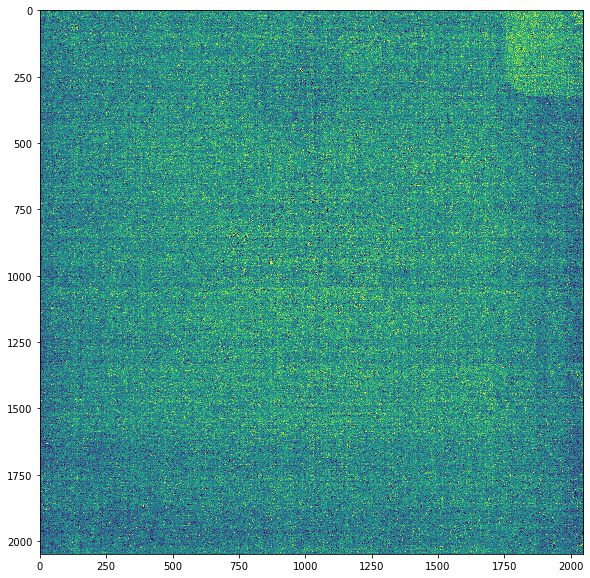

In [5]:
# Take median of all groups:
group_median = np.median(data_cube, axis=0)

# Plot it:
plt.figure(figsize=(10,10))

im = plt.imshow(group_median)
im.set_clim(-100,100)

Now let's remove this group median from each group:

In [6]:
for i in range(data_cube.shape[0]):
    data_cube[i, :, :] -= group_median

All right, let's plot a handful of groups to to check how they look like, and if we can spot some 1/f fluctuations:

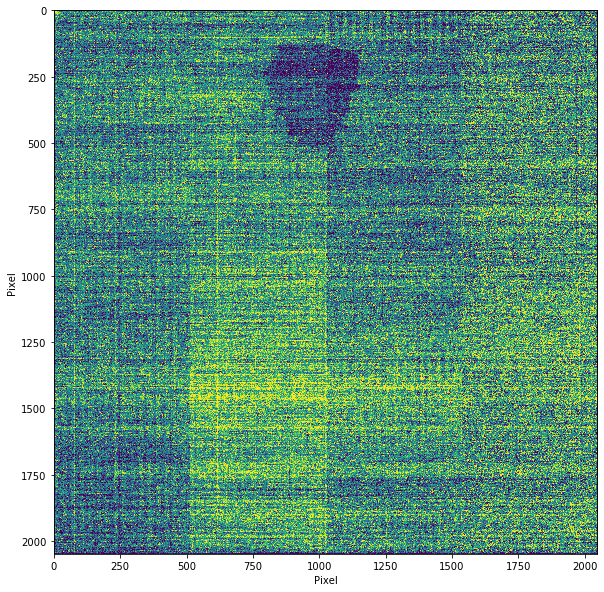

In [7]:
fig = plt.figure(figsize=(10,10))

# Create animation:
camera = Camera(fig)

# Iterate through all groups:
for ngroup in range(data_cube.shape[0]):
    im = plt.imshow(data_cube[ngroup, :, :] - np.median(data_cube[ngroup, :, :]))
    im.set_clim(-10,10)
    plt.xlabel('Pixel')
    plt.ylabel('Pixel')
    camera.snap()

In [8]:
anim = camera.animate()
HTML(anim.to_html5_video())

Awesome! Pretty evident. Some seem a bit weird (with a "head"-like figure at the top) but most are pretty similar to the ones shown on Figure 4 of Everett's paper. In any case, we'll take care of weird patterns later, when we do some "outlier" rejection just like in Everett's paper. 

In Figure 4 of Everett's paper, they did a close-up to columns 300 to 800 and rows 300 to 800. Let's do the same close-up:

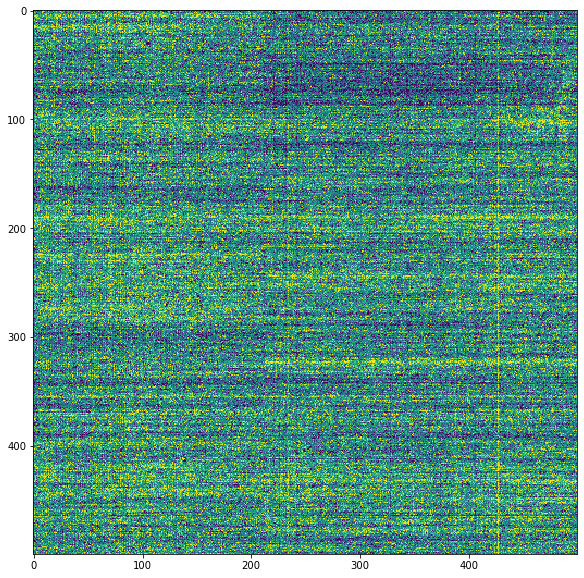

In [9]:
plt.figure(figsize=(10,10))
im = plt.imshow(data_cube[4, 300:800, 300:800])
im.set_clim(-10,10)

That looks good! We can even see by eye the amplifier gap at around 212 (note the image starts from column/row zero, but this is a cut from column 300 to 800 --- so physical units of column 212 above are really 212 + 300 = 512, exactly where we expect the amplifier gap according to Everett's papeR). Let's now move to the next step of actually computing the Power Spectral Densities.

### 2. Computing power spectral densities

OK, now we know we have the 1/f patterns. Let's follow <a href="https://ui.adsabs.harvard.edu/abs/2020AJ....160..231S/abstract">Schlawin et al. (2020)</a>, and compute the power spectral density (PSD) of the fluxes on these integrations. 

To this end, we perform the analysis on Amplifier 2 only, which goes from $X=512$ to $X=1024$:

In [10]:
amp2 = data_cube[:,:,512:1024]

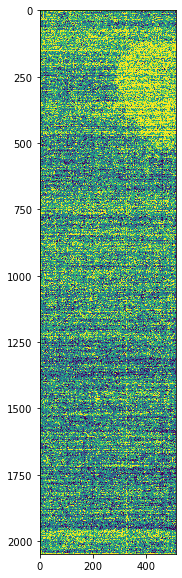

In [11]:
plt.figure(figsize=(10,10))

im = plt.imshow(amp2[1,:,:])
im.set_clim(-10,10)

Let's now convert this from spatial flux values into a time-series of fluxes. To this end, we consider the same time-scales assumed in Everett's paper; namely, that each pixel is read in 10$\mu$s, and that to jump to the next row takes 120$\mu$s. Let's work with the second group in our dataset to get an idea of how this will work.

First, we note that care has to be taken in deciding where to start counting pixels and _in which direction_. From Figure 1 in Everett's paper, the scheme of the detector reads is as follows:

<img src="nircam_detector.png" width="400" height="200"></img>

We are interested in analyzing amplifier 2, whose reading of pixels goes from _right to left_. This is important, because remember we want to follow _as closely as possible_ what the detector electronics are doing when reading pixels. What we will do in our analysis below, thus, is to start counting from the top right pixel, going to the left, all the way down to the bottom left pixel in the image above, remembering to (a) consider 10 microseconds of time to read each individual pixel and (b) add 120 microseconds when jumping through each row, i.e.:

<img src="image_direction.png" width="200" height="100"></img>

Let's work with the actual images, to make the process even clearer. To make it as transparent as possible, we will fill each of the fluxes obtained by the readout detector electronics (what I call the `flattened group` below) manually (there are of course pythonic ways of doing this --- but this illustrates the process much better); let's also count the times to create the time-array (i.e., the time associated with each flux read by the detector readout electronics), saving that in a `times` array. Of course, these arrays will have length 2048 x 512 = 1,048,576 (that's a _long_ array!):

In [12]:
# Work with second group:
group = amp2[1,:,:]
rows, cols = group.shape[0], group.shape[1]

# Prepare times and data arrays:
times = np.zeros(rows*cols) 
flattened_group = np.zeros(rows*cols)

ct = 0
counter = 0
for i in range(rows):
    # We sample fluxes from right to left --- to follow the readout direction. 
    # See, e.g., Figure 1: https://jwst-docs.stsci.edu/near-infrared-camera/nircam-instrumentation/nircam-detector-overview/nircam-detector-readout
    for j in range(cols-1,-1,-1):
        flattened_group[counter] = group[i,j]
        times[counter] = ct
        ct += 10
        counter += 1
    ct += 120

In [13]:
group.shape

(2048, 512)

In [14]:
len(times)

1048576

Let's plot this time-series (we do a little close-up --- otherwise, it is basically impossible to see anything):

Text(0, 0.5, 'Flux (DN)')

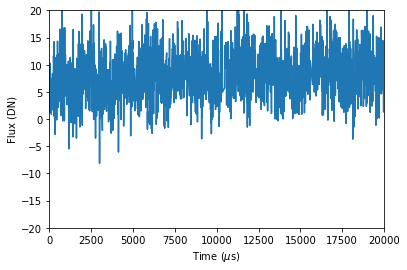

In [15]:
plt.plot(times,flattened_group)
plt.xlim(0,20000)
plt.ylim(-20,20)
plt.xlabel('Time ($\mu$s)')
plt.ylabel('Flux (DN)')

Just to see if we _actually_ did what we wanted to do, let's check if there is a gap in time close to pixel 513:

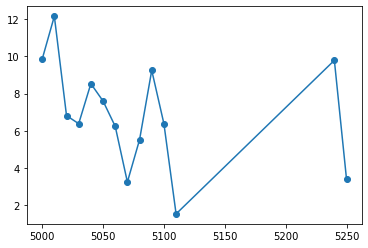

In [16]:
plt.plot(times[500:514],flattened_group[500:514],'o-')

Indeed --- separated by the 120$\mu$s, as we wanted. What about the next cycle?

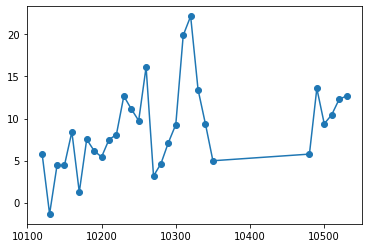

In [17]:
plt.plot(times[1000:1030],flattened_group[1000:1030],'o-')

Same! All is good then; the code did what we wanted.

There's evident correlation between the flux values --- definitely non-white, poissonian/gaussian noise! Let's calculate the power spectral density of this time-series, making sure to mask all pixels with absolute values larger than 80. This latter cut is what Everett did in his paper to remove outlier flux values (like the "head" shape we saw at the beggining of this Notebook), and we repeat it here --- but note this count value might be different in other instruments, so has to be investigated on a case-by-case basis. Below I repeat the same calculation using a "robust" outlier detection scheme which might be more generic than this "80 count" cut and got the same results. I repeat the "80 count" cut here to be consistent with Everett's paper:

In [18]:
good_values = np.where(np.abs(flattened_group)<=80.)[0]
print(len(good_values))
frequency, power = LombScargle(times[good_values]*1e-6, flattened_group[good_values]).autopower()

1046701


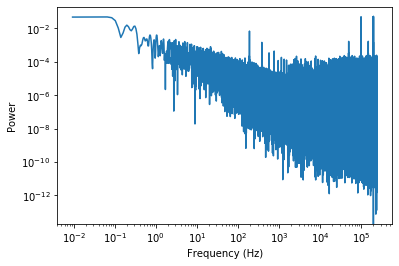

In [19]:
plt.plot(frequency, power)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')

The slope is evident in the periodogram! However, it is too noisy. Let's thus repeat the same thing for all the other groups, stack the periodograms, plotting the average one. To this end, let's first extract the fluxes on all the groups: 

In [20]:
flattened_groups = np.zeros([108, len(flattened_group)])

In [21]:
for n in range(amp2.shape[0]):
    group = amp2[n,:,:]
    counter = 0
    for i in range(rows):
        for j in range(cols-1,-1,-1):
            flattened_groups[n,counter] = group[i,j]
            counter += 1

Now let's define a common frequency grid. The one below is, in fact, the very same used by Everett on his paper:

In [22]:
new_frequency = np.linspace(1./5.,1./2e-5,65536)

Now let's compute the periodogram of each group; once again, masking only "good" pixels as deemed by that study as values smaller than 80 counts:

In [23]:
powers = np.zeros([amp2.shape[0], len(new_frequency)])
for n in range(amp2.shape[0]):
    good_values = np.where(np.abs(flattened_groups[n,:])<=80.)[0]
    powers[n,:] = LombScargle(times[good_values]*1e-6, flattened_groups[n,good_values]).power(new_frequency)

Let's plot all on top of each other first, for pure fun:

(5e-08, 0.05)

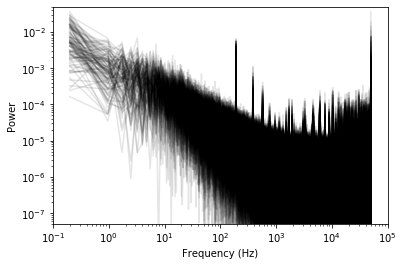

In [24]:
for n in range(amp2.shape[0]):
    plt.plot(new_frequency, powers[n,:],zorder=1,alpha=0.1,color='black')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.1,1e5)
plt.ylim(0.5*1e-7,0.5*1e-1)

All right, finally, let's collapse all the lomb-scargle periodograms into one using the median (I know I said the "average" --- I lied):

(5e-08, 0.05)

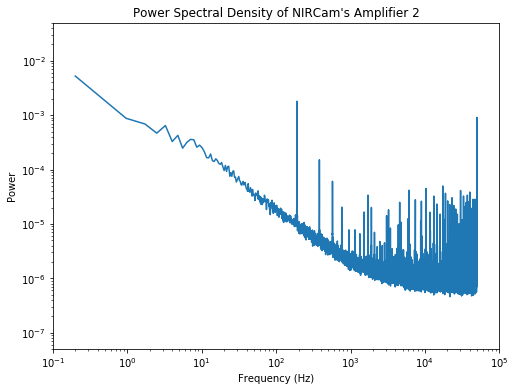

In [25]:
plt.figure(figsize=(8,6))

plt.title("Power Spectral Density of NIRCam's Amplifier 2")
plt.plot(new_frequency, np.median(powers,axis=0),zorder=1)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.xlim(0.1,1e5)
plt.ylim(0.5*1e-7,0.5*1e-1)

Nice! Very same plot as Everett's.

Once again, according to this analysis, the curve seems to flatten at about $10^4$ Hz. We see various peaks like the one at 190 Hz (524 time-cycles; also seen in <a href="https://ui.adsabs.harvard.edu/abs/2011SPIE.8155E..0CR/abstract">Rauscher et al., 2011</a>), which is the largest peak in this periodogram. But, of course, the most obvious part is the 1/f component --- it goes all the way to lower frequencies!

### 3. Getting the same plot with a generic outlier-detection scheme

Here I compare the resulting power spectral density using a more "generic" outlier detection scheme. First, we need to know a typical dispersion of the data --- one good measure to do this is the <a href="https://en.wikipedia.org/wiki/Median_absolute_deviation">median-absolute deviation (MAD)</a>, which is an outlier-resistant metric to estimate the dispersion of the data. Interestingly, the MAD and the standard-deviation assuming gaussian noise have a direct linear relationship --- $\sigma = 1.4826 \times MAD $. We can use that to then remove all pixels deviating more than, say, 10 sigma from the median value. The caveat here is that the noise is _not_ white-gaussian, but 10-sigma is such a large value that this doesn't matter that much.

Let's first create a function that calculates the MAD:

In [26]:
def get_MAD_sigma(x,median):
    """
    This function returns the MAD-based standard-deviation.
    """
    mad = np.median(np.abs(x-median))
    return 1.4826*mad

All right, let's now repeat the same power-spectral density estimation as above, but considering as "good pixels" pixels which are within 10-$\sigma$ form the median, where $\sigma$ is estimated with the MAD. We plot the values of those $\sigma$'s below:

In [27]:
# We will save the new PSD in a new array:
new_powers = np.zeros([amp2.shape[0], len(new_frequency)])
# Let's also save the sigmas on each group:
sigmas = np.zeros(amp2.shape[0])
np.save('frequencies', new_frequency)
for n in range(amp2.shape[0]):
    group_median_flux = np.median(flattened_groups[n,:])
    sigma = get_MAD_sigma(flattened_groups[n,:], group_median_flux)
    sigmas[n] = sigma
    good_values = np.where(np.abs(flattened_groups[n,:] - group_median_flux)<= 10.*sigma)[0]
    np.save('times_sec_group_'+str(n), times[good_values]*1e-6)
    np.save('corrected_group_'+str(n), flattened_groups[n,good_values])
    new_powers[n,:] = LombScargle(times[good_values]*1e-6, flattened_groups[n,good_values]).power(new_frequency)

Text(0, 0.5, 'MAD-based $\\sigma$')

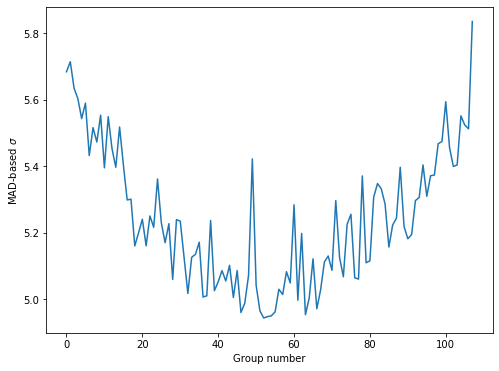

In [28]:
plt.figure(figsize=(8,6))
plt.plot(sigmas)
plt.xlabel('Group number')
plt.ylabel('MAD-based $\sigma$')

The MAD-based values of $\sigma$ are all more or less the same! Which is reasurring --- and good. Basically, its on the order of 5 --- meaning that our 10-$\sigma$ outlier rejection basically removes counts higher than about 50; very similar to the "80 cut" made by Everett.

Let's now plot the average periodogram using this outlier-detection method, and Everett's:

(5e-08, 0.05)

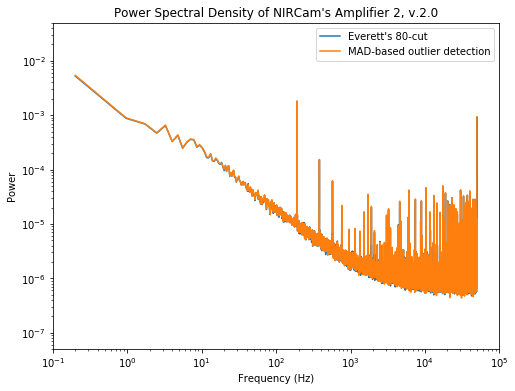

In [29]:
plt.figure(figsize=(8,6))

plt.title("Power Spectral Density of NIRCam's Amplifier 2, v.2.0")
plt.plot(new_frequency, np.median(powers,axis=0),zorder=1, label ="Everett's 80-cut")
plt.plot(new_frequency, np.median(new_powers,axis=0),zorder=1, label ="MAD-based outlier detection")
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.xlim(0.1,1e5)
plt.ylim(0.5*1e-7,0.5*1e-1)

It is basically the same thing! This is good then; for analyses made in other instruments, we might want to use the MAD-based outlier detection, which is a bit more generic.

### 4. Making sense of the PSD and "whitening" experiments
<sub>*NOTE OF CAUTION:* Below, I use "column-to-column" and "row-by-row" intercheangably _a lot_. I blame the NIRCam folks on this. The orientation of their amplifiers in GRISMR (which is the orientation enabled for Cycle 1) is perpendicular to the orientation of all the other instruments because it enabled faster readouts for them --- but that introduced the problem that the "1/f" pattern goes _in the same direction as the spectra_, so it's hard to "remove". So, the 1/f pattern in NIRCam data (at least as plotted in this notebook) goes along the rows (so "row-to-row" substraction should be the right way to speak about performing, e.g., the median on each row and removing that value from that row). In all the other instruments, it goes along the columns (so "column-to-column" substraction is performed on them).</sub>

The PSD shown in the previous section suggests that, if we look closely enough in our time-series (i.e., for pixels very close together both in time and space; very high frequencies), the noise looks relatively white (i.e., the right-side of the PSD). As we go to larger number of pixels (larger time-scales --- smaller frequencies), then the data starts to look _very_ correlated --- this is the "long-memory" issue with 1/f noise. The key frequency separating both regimes seems to be around $10^{4}$ Hz, which corresponds to a time-scale of about 100 microseconds --- a length-scale of about 10 pixels. At these length-scales or smaller, we are "zooming in" into the time-series of the pixels and we could just remove systematic offsets (produced by the longer-scale correlations) by simple column-to-column substractions (which are nothing more than substracting running means/medians on each of the "zooms" we do to the time-series). However, such length-scales are _very_ small and, in fact, there are no subarrays smaller than 10 pixels in reality because at those lengths we start losing flux from the sources on the detector whose spectral PSFs are much larger than that. At length-scales _larger_ than those 10 pixels, column-to-column substractions are just ineffective at removing this correlated noise structure. 

To illustrate how important these correlations are, and how column-to-column substraction does _not_ take care of the entire problem even in very small subarrays, let's first "emulate" a subarray using the NIRCam darks <a href="https://jwst-docs.stsci.edu/near-infrared-spectrograph/nirspec-instrumentation/nirspec-detectors/nirspec-detector-subarrays"> similar to the smallest subarrays being used by NIRSpec</a>, of 32 and 16 pixels. **We note this is in fact a bad approximation to the real subarrays** (we have tested this internally! Stephan Birkman actually called me out on this one --- thanks Stephan!), but it is nonetheless illustrative to perform these tests as it allows to survey how the "timing" of the subarrays impact on the time-scales one removes with column-to-column substractions. 

Let's first create a function that is able to compute the power spectral density of the central $N$ pixels on NIRCam's amplifier 2:

In [30]:
def getPSD(data, N, central_pixel = 256, ngroups = 108, t_pix_read = 10, t_row_jump = 120, nsigma = 10):
    """
    This function takes as input a dataset containing an integration with a handful of groups (i.e., data 
    has shape (ngroups, npix_x, npix_y), where npix_x and npix_y are the number of pixels in the x and y 
    direction), and produces a median power spectral density of the N central pixels. N needs to be divisible 
    by two.
    """
    
    # Prepare times and data arrays:
    times = np.zeros(rows*N) 
    flattened_group = np.zeros(rows*N)
    flattened_groups = np.zeros([ngroups, len(flattened_group)])
    ct = 0
    counter = 0
    for n in range(data.shape[0]):
        group = data[n,:,:]
        counter = 0
        for i in range(rows):
            for j in range(cols-1,-1,-1):
                if j > central_pixel-(N/2) and j <= central_pixel+(N/2):
                    if n == 0:
                        times[counter] = ct
                    flattened_groups[n,counter] = group[i,j]
                    counter += 1
                ct += t_pix_read
            ct += t_row_jump
            
    # Get the median power spectral density
    new_powers = np.zeros([data.shape[0], len(new_frequency)])
    
    # Let's also save the sigmas on each group:
    sigmas = np.zeros(data.shape[0])
    for n in range(data.shape[0]):
        group_median_flux = np.median(flattened_groups[n,:])
        sigma = get_MAD_sigma(flattened_groups[n,:], group_median_flux)
        sigmas[n] = sigma
        good_values = np.where(np.abs(flattened_groups[n,:] - group_median_flux)<= nsigma*sigma)[0]
        new_powers[n,:] = LombScargle(times[good_values]*1e-6, flattened_groups[n,good_values]).power(new_frequency)
        
    return np.median(new_powers,axis=0)

### 4.1 "Mock/virtual" 32-pixel subarray

Let's suppose we want to simulate a small subarray of only 32 pixels. Let's be generous, and suppose our spectra is in the central 22 pixels --- so we can use the 10 pixels outside of this central part to perform column-to-column substraction. Let's see how the PSD of these 22 central pixels looks like first:

In [31]:
psd_32 = getPSD(amp2, 22)

No handles with labels found to put in legend.


(5e-08, 0.05)

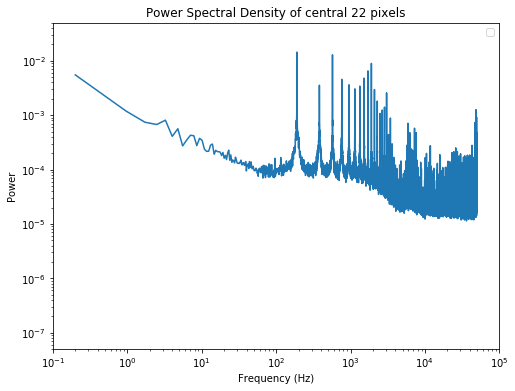

In [32]:
plt.figure(figsize=(8,6))

plt.title("Power Spectral Density of central 22 pixels")
plt.plot(new_frequency, psd_32,zorder=1)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.xlim(0.1,1e5)
plt.ylim(0.5*1e-7,0.5*1e-1)

We immediately note this is not the "pure" 1/f noise PSD. It seems it is a 1/f PSD combined with a bump at $<10^4$ Hz. Now, let's perform column-to-column substraction to those central 22 pixels using the 10 pixels outside of our "virtual" subarray. I've created a function do this below:

In [33]:
def column_by_column(data, N, cc_N, central_pixel = 256):
    """
    This function assumes we want to remove counts from a central region between central_pixel -/+ N/2. 
    To remove those counts, the median of cc_N pixels above and below those limits are used. 
    To understand the code snippet below, it is useful to remember that in python, if x = [0,1,2,3], then 
    x[a:b] with a = 1 and b = 2 gives back [1] --- that is, that a:b cut includes a, but excludes b.
    """
    new_im = np.copy(data)
    lower_limit = int(central_pixel - N/2 - 1)
    upper_limit = int(central_pixel + N/2 + 1)
    for i in range(rows):
        new_im[i,lower_limit:upper_limit] -= \
        np.median(np.append(new_im[i,lower_limit-cc_N:lower_limit],new_im[i,upper_limit:upper_limit+cc_N+1]))
    return new_im

Let's test it on our data with the sixth group, just to see what we are doing:

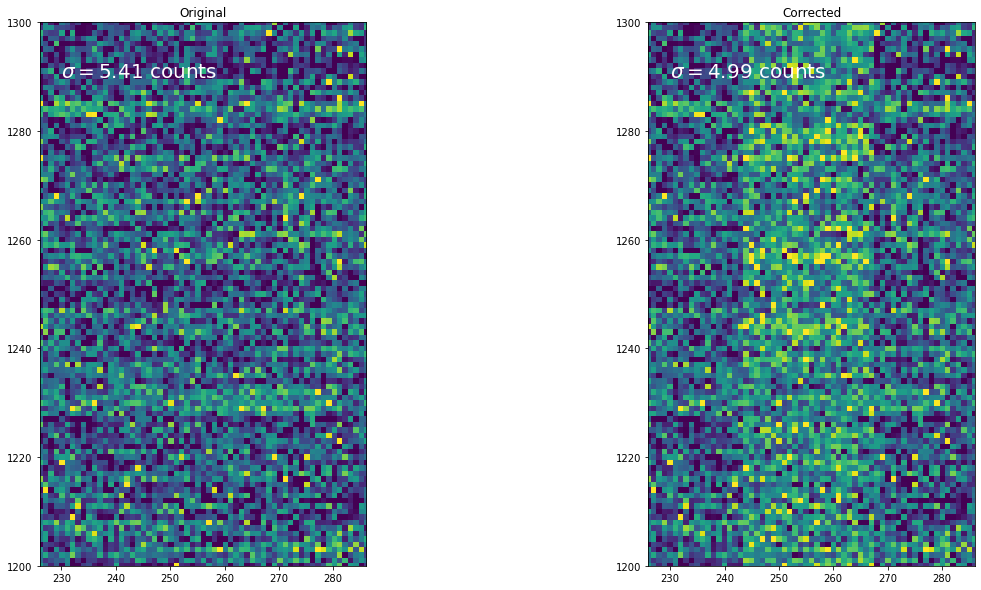

In [34]:
group_number = 5

# Perform column-to-column substraction on a central region of N = 22 pixels, using cc_N = 5 pixels above and 
# below --- 32 pixels used in total, just like in our virtual "subarray" 32-pixel setup!
central_pixel, N, cc_N = 256, 22, 5
lower_limit = int(central_pixel - N/2 - 1)
upper_limit = int(central_pixel + N/2 + 1)

corrected = column_by_column(amp2[group_number,:,:], N, cc_N)

# Plot original v/s corrected
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.title('Original')
im = plt.imshow(amp2[group_number,:,:])
fa = amp2[group_number,:, lower_limit:upper_limit].flatten()
sigma_original = get_MAD_sigma(fa, np.median(fa))
plt.text(230,1290,r'$\sigma = {0:.2f}$ counts'.format(sigma_original),color='white',fontsize=20)
im.set_clim(-10,10)
plt.xlim(256-30,256+30)
plt.ylim(1250-50,1250+50)

plt.subplot(122)
plt.title('Corrected')
im2 = plt.imshow(corrected)
cfa = corrected[:, lower_limit:upper_limit].flatten()
sigma_corrected = get_MAD_sigma(cfa, np.median(cfa))
plt.text(230,1290,r'$\sigma = {0:.2f}$ counts'.format(sigma_corrected),color='white',fontsize=20)
plt.xlim(256-30,256+30)
plt.ylim(1250-50,1250+50)
im2.set_clim(-10,10)

Cool, the correction works --- there is a mild (but significant, judging from our MAD-sigma versus group number plot above) decrease in the standard-deviation of the counts within those 22 pixels. Let's get the PSD of the corrected images:

In [35]:
# First, generate array that will host the corrected amp2 data:
corrected_amp2 = np.zeros(amp2.shape)

# Apply the column-to-column correction:
for n in range(amp2.shape[0]):
    corrected_amp2[n,:,:] = column_by_column(amp2[n,:,:], N, cc_N)

In [36]:
# Generate PSD of corrected data:
psd_corrected_32 = getPSD(corrected_amp2, 22)

Generate white-noise spectrum for comparison. To this end, fill an amp2-like array with white noise, and calculate its PSD:

In [37]:
wn_amp2 = np.zeros(amp2.shape)

for n in range(amp2.shape[0]):
    flattened_group = amp2[n,:,:].flatten()
    wn_group_median_flux = np.median(flattened_group)
    wn_sigma = get_MAD_sigma(flattened_group, wn_group_median_flux)
    wn_amp2[n,:,:] = np.random.normal(0., wn_sigma, amp2[n,:,:].shape)

In [38]:
psd_wn_32 = getPSD(wn_amp2, 22)

Plot everything:

(5e-08, 0.05)

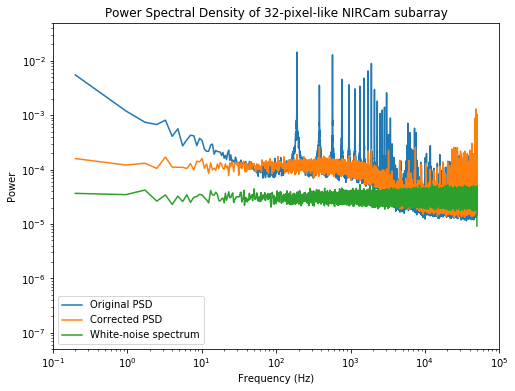

In [39]:
plt.figure(figsize=(8,6))

plt.title("Power Spectral Density of 32-pixel-like NIRCam subarray")
plt.plot(new_frequency, psd_32,zorder=1,label ='Original PSD')
plt.plot(new_frequency, psd_corrected_32,zorder=1,label ='Corrected PSD')
plt.plot(new_frequency, psd_wn_32,zorder=1,label ='White-noise spectrum')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.xlim(0.1,1e5)
plt.ylim(0.5*1e-7,0.5*1e-1)

This plot is very telling. As expected, from our discussion above, there is still significant power present in the corrected PSD --- we don't reach the white-noise spectrum with the column-to-column substraction. However, we've effectively removed the 1/f component and many of the harmonics present in the data, leaving us with a PSD which raises above the white-noise plateau below $10^{4}$ Hz, and which flattens to lower frequencies. This resembles a $Q=1/2$ or $Q=1/\sqrt{2}$ PSD of of a stochastically-driven simple harmonic oscillator (see equation (20) and Figure 1 in <a href="https://arxiv.org/abs/1703.09710"> this paper</a>).

### 4.2 "Mock/virtual" 16-pixel subarray

Let's repeat the above for a "virtual" 16-pixel subarray. To this end, let's again be generous, and pressume only the central 6 pixels will contain a spectrum, leaving 10 pixels outside these to perform column-to-column substraction. Let's compute the PSD of those central 6 pixels:

In [40]:
psd_16 = getPSD(amp2, 6)

No handles with labels found to put in legend.


(5e-08, 0.05)

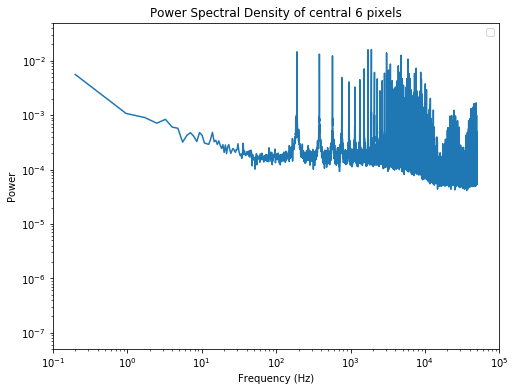

In [41]:
plt.figure(figsize=(8,6))

plt.title("Power Spectral Density of central 6 pixels")
plt.plot(new_frequency, psd_16,zorder=1)
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.xlim(0.1,1e5)
plt.ylim(0.5*1e-7,0.5*1e-1)

All right, very similar to the above; the "bump" at $<10^4$ Hz is fairly smaller as we expected --- close-by pixels seem to be more "white" overall. Let's do column-by-column:

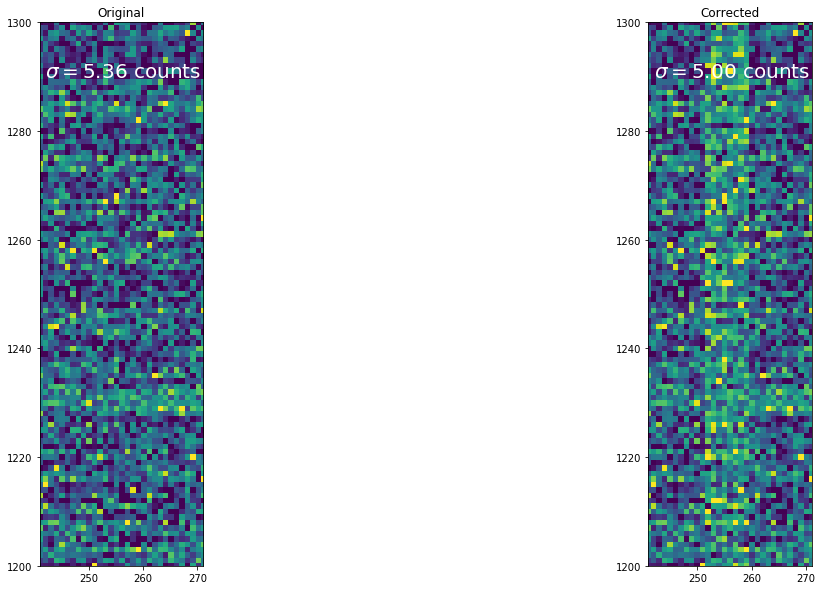

In [42]:
group_number = 5

# Perform column-to-column substraction on a central region:
central_pixel, N, cc_N = 256, 6, 5
lower_limit = int(central_pixel - N/2 - 1)
upper_limit = int(central_pixel + N/2 + 1)

corrected = column_by_column(amp2[group_number,:,:], N, cc_N)

# Plot original v/s corrected
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.title('Original')
im = plt.imshow(amp2[group_number,:,:])
fa = amp2[group_number,:, lower_limit:upper_limit].flatten()
sigma_original = get_MAD_sigma(fa, np.median(fa))
plt.text(242,1290,r'$\sigma = {0:.2f}$ counts'.format(sigma_original),color='white',fontsize=20)
im.set_clim(-10,10)
plt.xlim(256-15,256+15)
plt.ylim(1250-50,1250+50)

plt.subplot(122)
plt.title('Corrected')
im2 = plt.imshow(corrected)
cfa = corrected[:, lower_limit:upper_limit].flatten()
sigma_corrected = get_MAD_sigma(cfa, np.median(cfa))
plt.text(242,1290,r'$\sigma = {0:.2f}$ counts'.format(sigma_corrected),color='white',fontsize=20)
plt.xlim(256-15,256+15)
plt.ylim(1250-50,1250+50)
im2.set_clim(-10,10)

Again, small --- but significant --- decrease on the standard-deviation. Let's see the PSDs:

In [43]:
# First, generate array that will host the corrected amp2 data:
corrected_amp2 = np.zeros(amp2.shape)

# Apply the column-to-column correction:
for n in range(amp2.shape[0]):
    corrected_amp2[n,:,:] = column_by_column(amp2[n,:,:], N, cc_N)

In [44]:
# Generate PSD of corrected data:
psd_corrected_16 = getPSD(corrected_amp2, 6)

In [45]:
# PSD of white-noise
psd_wn_16 = getPSD(wn_amp2, 6)

And plot:

(5e-08, 0.05)

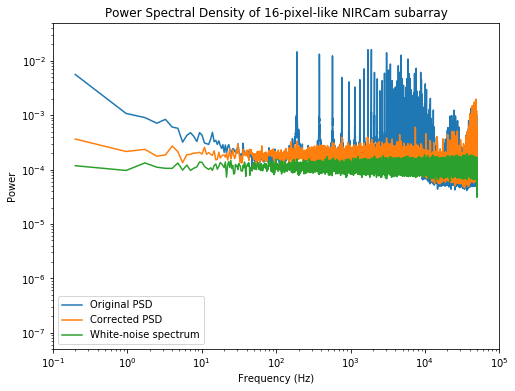

In [46]:
plt.figure(figsize=(8,6))

plt.title("Power Spectral Density of 16-pixel-like NIRCam subarray")
plt.plot(new_frequency, psd_16,zorder=1,label ='Original PSD')
plt.plot(new_frequency, psd_corrected_16,zorder=1,label ='Corrected PSD')
plt.plot(new_frequency, psd_wn_16,zorder=1,label ='White-noise spectrum')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.xlim(0.1,1e5)
plt.ylim(0.5*1e-7,0.5*1e-1)

As expected, once again --- much closer to white-noise, but not quite. There is still a bump left below $10^{4}$ Hz.

We might wonder if, perhaps, when wanting to correct the central 6 pixels, we should use only a handful of pixels above and below them such that we stay in the "white-noise" regime of the correlated noise (say, 2 pixels above, 2 pixels below). Let's see if that helps:

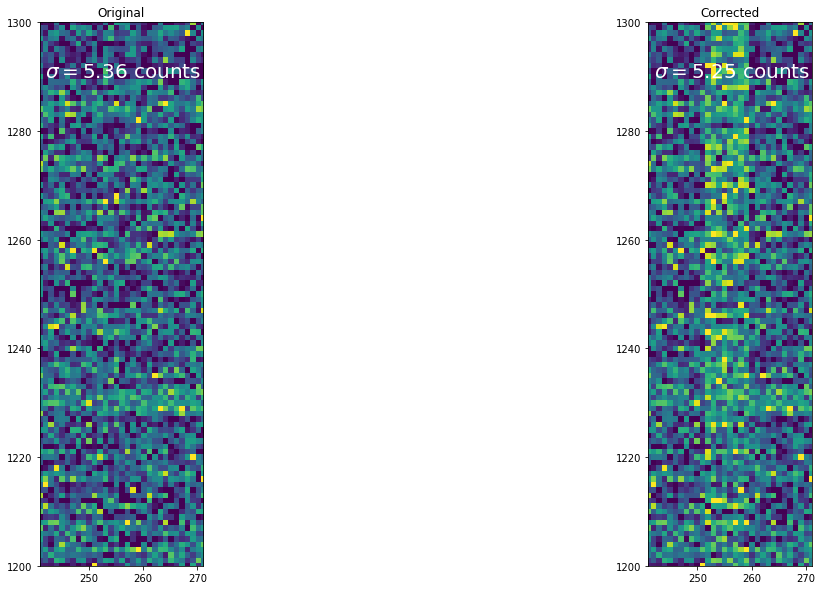

In [47]:
group_number = 5

# Perform column-to-column substraction on a central region:
central_pixel, N, cc_N = 256, 6, 2
lower_limit = int(central_pixel - N/2 - 1)
upper_limit = int(central_pixel + N/2 + 1)

corrected = column_by_column(amp2[group_number,:,:], N, cc_N)

# Plot original v/s corrected
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.title('Original')
im = plt.imshow(amp2[group_number,:,:])
fa = amp2[group_number,:, lower_limit:upper_limit].flatten()
sigma_original = get_MAD_sigma(fa, np.median(fa))
plt.text(242,1290,r'$\sigma = {0:.2f}$ counts'.format(sigma_original),color='white',fontsize=20)
im.set_clim(-10,10)
plt.xlim(256-15,256+15)
plt.ylim(1250-50,1250+50)

plt.subplot(122)
plt.title('Corrected')
im2 = plt.imshow(corrected)
cfa = corrected[:, lower_limit:upper_limit].flatten()
sigma_corrected = get_MAD_sigma(cfa, np.median(cfa))
plt.text(242,1290,r'$\sigma = {0:.2f}$ counts'.format(sigma_corrected),color='white',fontsize=20)
plt.xlim(256-15,256+15)
plt.ylim(1250-50,1250+50)
im2.set_clim(-10,10)

Apparently, 2 pixels above or below is just too few pixels to correct for this --- decrease in the standard-deviation is negligible. What about the PSDs?

In [48]:
# First, generate array that will host the corrected amp2 data:
corrected_amp2 = np.zeros(amp2.shape)

# Apply the column-to-column correction:
for n in range(amp2.shape[0]):
    corrected_amp2[n,:,:] = column_by_column(amp2[n,:,:], N, cc_N)

In [49]:
# Generate PSD of corrected data:
psd_corrected_16 = getPSD(corrected_amp2, 6)

(5e-08, 0.05)

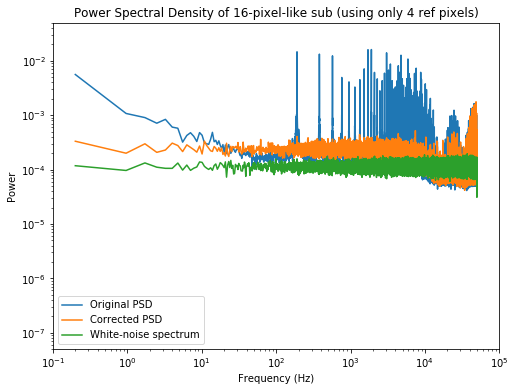

In [50]:
plt.figure(figsize=(8,6))

plt.title("Power Spectral Density of 16-pixel-like sub (using only 4 ref pixels)")
plt.plot(new_frequency, psd_16,zorder=1,label ='Original PSD')
plt.plot(new_frequency, psd_corrected_16,zorder=1,label ='Corrected PSD')
plt.plot(new_frequency, psd_wn_16,zorder=1,label ='White-noise spectrum')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.xlim(0.1,1e5)
plt.ylim(0.5*1e-7,0.5*1e-1)

It seems it doesn't help much further. However, overall, it seems using only 4 or 10 reference pixels doesn't make much of a difference on the PSD removal, at least at these smaller subarrays. The PSD "bump" below $10^4$ remains. More pixels do make a difference in diminishing the overall scatter --- which I believe makes sense if we see this column-by-column as a "filter"; the more samples we use for this filter, the better as long as we are in a window small enough that we are able to remove some of the correlated noise structure (i.e., time-scales of the process are larger than the window). 

### 4.3 Larger "mock"-subarrays --- emulating SOSS' SUBSTRIP96

Let's try the same experiment now, but emulating SOSS SUBSTRIP96 subarray. Let's assume the central 50 pixels have a spectrum, and we want to remove the 1/f pattern using the remaining 46 pixels:

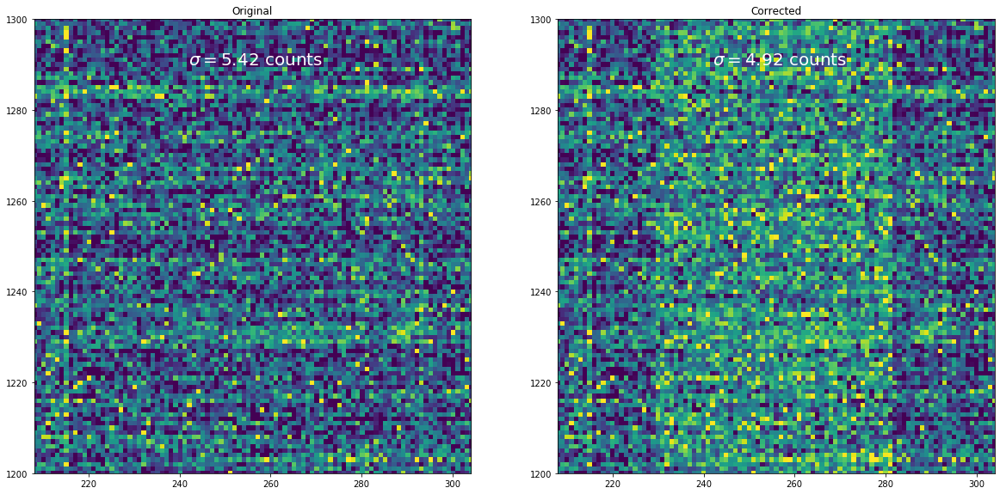

In [51]:
group_number = 5

# Perform column-to-column substraction on a central region:
central_pixel, N, cc_N = 256, 50, 23
lower_limit = int(central_pixel - N/2 - 1)
upper_limit = int(central_pixel + N/2 + 1)

corrected = column_by_column(amp2[group_number,:,:], N, cc_N)

# Plot original v/s corrected
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.title('Original')
im = plt.imshow(amp2[group_number,:,:])
fa = amp2[group_number,:, lower_limit:upper_limit].flatten()
sigma_original = get_MAD_sigma(fa, np.median(fa))
plt.text(242,1290,r'$\sigma = {0:.2f}$ counts'.format(sigma_original),color='white',fontsize=20)
im.set_clim(-10,10)
plt.xlim(256-48,256+48)
plt.ylim(1250-50,1250+50)

plt.subplot(122)
plt.title('Corrected')
im2 = plt.imshow(corrected)
cfa = corrected[:, lower_limit:upper_limit].flatten()
sigma_corrected = get_MAD_sigma(cfa, np.median(cfa))
plt.text(242,1290,r'$\sigma = {0:.2f}$ counts'.format(sigma_corrected),color='white',fontsize=20)
plt.xlim(256-48,256+48)
plt.ylim(1250-50,1250+50)
im2.set_clim(-10,10)

In [52]:
psd_96 = getPSD(amp2, N)

In [53]:
# First, generate array that will host the corrected amp2 data:
corrected_amp2 = np.zeros(amp2.shape)

# Apply the column-to-column correction:
for n in range(amp2.shape[0]):
    corrected_amp2[n,:,:] = column_by_column(amp2[n,:,:], N, cc_N)

In [54]:
# Generate PSD of corrected data:
psd_corrected_96 = getPSD(corrected_amp2, N)

In [55]:
# PSD of white-noise:
psd_wn_96 = getPSD(wn_amp2, N)

(5e-08, 0.05)

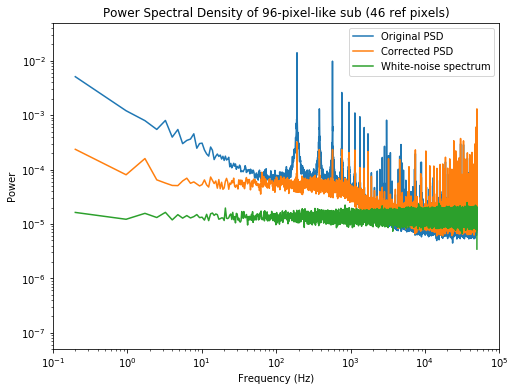

In [56]:
plt.figure(figsize=(8,6))

plt.title("Power Spectral Density of 96-pixel-like sub (46 ref pixels)")
plt.plot(new_frequency, psd_96,zorder=1,label ='Original PSD')
plt.plot(new_frequency, psd_corrected_96,zorder=1,label ='Corrected PSD')
plt.plot(new_frequency, psd_wn_96,zorder=1,label ='White-noise spectrum')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.xlim(0.1,1e5)
plt.ylim(0.5*1e-7,0.5*1e-1)

Much larger bump than for the above subarrays --- but overall a very similar story.

### 4.4 Larger "mock"-subarrays, pt. II --- emulating SOSS' SUBSTRIP256

Pretty self-explainatory. Let's assume same 50 pixels, but let's use 206 as reference:

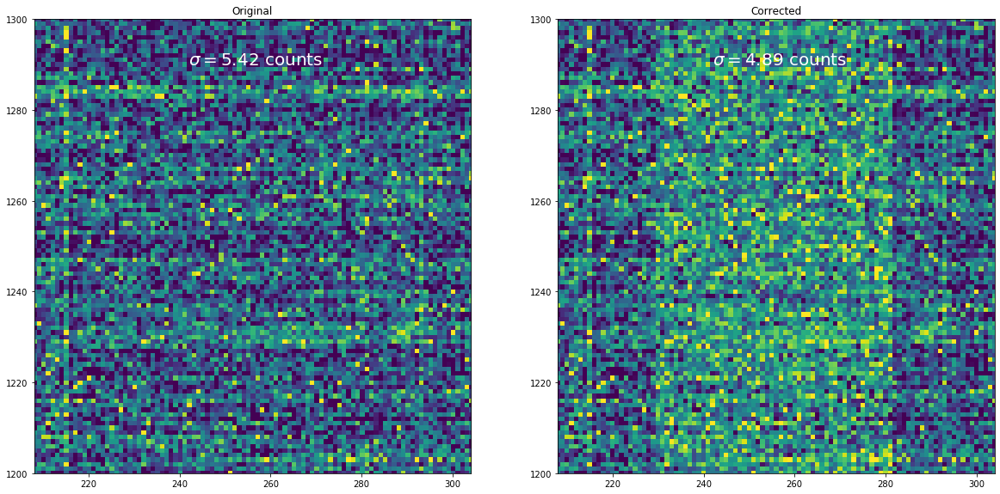

In [57]:
group_number = 5

# Perform column-to-column substraction on a central region:
central_pixel, N, cc_N = 256, 50, 103
lower_limit = int(central_pixel - N/2 - 1)
upper_limit = int(central_pixel + N/2 + 1)

corrected = column_by_column(amp2[group_number,:,:], N, cc_N)

# Plot original v/s corrected
plt.figure(figsize=(20,10))
plt.subplot(121)
plt.title('Original')
im = plt.imshow(amp2[group_number,:,:])
fa = amp2[group_number,:, lower_limit:upper_limit].flatten()
sigma_original = get_MAD_sigma(fa, np.median(fa))
plt.text(242,1290,r'$\sigma = {0:.2f}$ counts'.format(sigma_original),color='white',fontsize=20)
im.set_clim(-10,10)
plt.xlim(256-48,256+48)
plt.ylim(1250-50,1250+50)

plt.subplot(122)
plt.title('Corrected')
im2 = plt.imshow(corrected)
cfa = corrected[:, lower_limit:upper_limit].flatten()
sigma_corrected = get_MAD_sigma(cfa, np.median(cfa))
plt.text(242,1290,r'$\sigma = {0:.2f}$ counts'.format(sigma_corrected),color='white',fontsize=20)
plt.xlim(256-48,256+48)
plt.ylim(1250-50,1250+50)
im2.set_clim(-10,10)

In [58]:
psd_256 = getPSD(amp2, N)

In [59]:
# First, generate array that will host the corrected amp2 data:
corrected_amp2 = np.zeros(amp2.shape)

# Apply the column-to-column correction:
for n in range(amp2.shape[0]):
    corrected_amp2[n,:,:] = column_by_column(amp2[n,:,:], N, cc_N)

In [60]:
# Generate PSD of corrected data:
psd_corrected_256 = getPSD(corrected_amp2, N)

In [61]:
# PSD of white-noise:
psd_wn_256 = getPSD(wn_amp2, N)

(5e-08, 0.05)

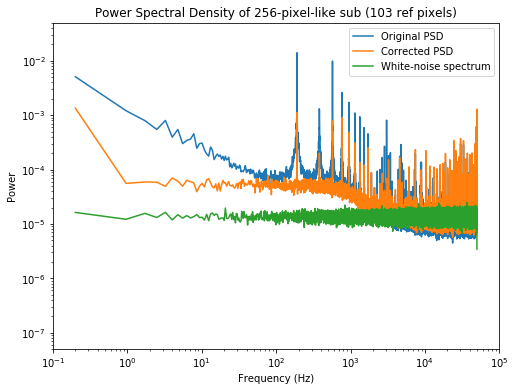

In [62]:
plt.figure(figsize=(8,6))

plt.title("Power Spectral Density of 256-pixel-like sub (103 ref pixels)")
plt.plot(new_frequency, psd_256,zorder=1,label ='Original PSD')
plt.plot(new_frequency, psd_corrected_256,zorder=1,label ='Corrected PSD')
plt.plot(new_frequency, psd_wn_256,zorder=1,label ='White-noise spectrum')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.xlim(0.1,1e5)
plt.ylim(0.5*1e-7,0.5*1e-1)

Again --- pretty much the same and expected result: some 1/f noise/tail removal.

### 4.5 Column-by-column on the entire amplifier

We have been "cheating" in our PSDs above because we have not been padding times at the edges of the subarrays as it will really happen with them. Also, the PSD we are cutting is definitely different from the one in the entire amplifier --- probably because of our "sampling" from this 1/f realization which is the entire amplifier. So --- what happens if we do column-by-column with the entire amplifier? Does the noise get whitened? Let's see:

In [63]:
def full_column_by_column(data):
    """
    This function removes the median from all rows. That's it.
    """
    new_im = np.copy(data)
    for i in range(rows):
        new_im[i,:] -= np.median(new_im[i,:])
    return new_im

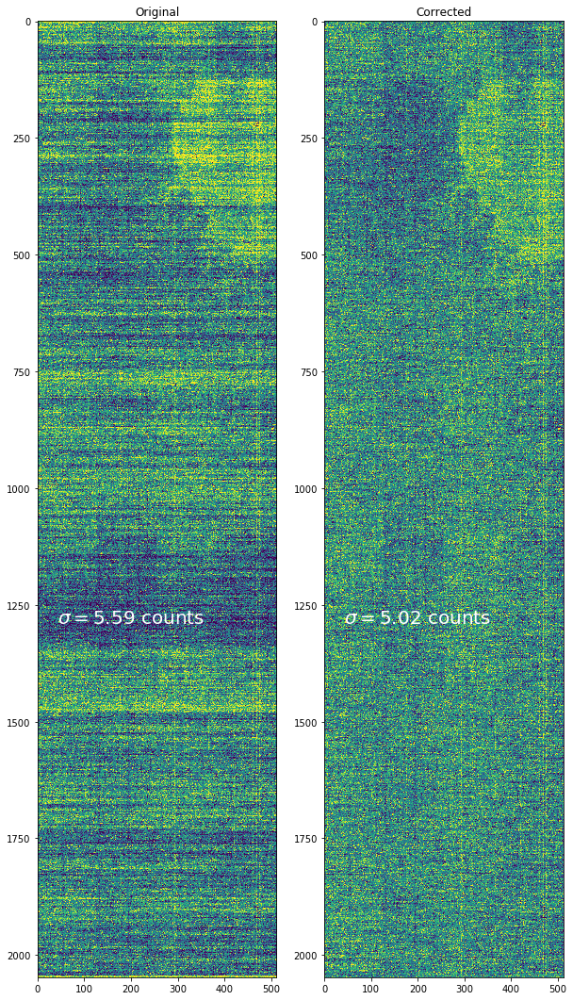

In [64]:
group_number = 5

# Perform column-to-column substraction on a central region:
corrected = full_column_by_column(amp2[group_number,:,:])

# Plot original v/s corrected
plt.figure(figsize=(10,20))
plt.subplot(121)
plt.title('Original')
im = plt.imshow(amp2[group_number,:,:])
fa = amp2[group_number,:, :].flatten()
sigma_original = get_MAD_sigma(fa, np.median(fa))
plt.text(42,1290,r'$\sigma = {0:.2f}$ counts'.format(sigma_original),color='white',fontsize=20)
im.set_clim(-10,10)
#plt.xlim(256-48,256+48)
#plt.ylim(1250-50,1250+50)

plt.subplot(122)
plt.title('Corrected')
im2 = plt.imshow(corrected)
cfa = corrected.flatten()
sigma_corrected = get_MAD_sigma(cfa, np.median(cfa))
plt.text(42,1290,r'$\sigma = {0:.2f}$ counts'.format(sigma_corrected),color='white',fontsize=20)
#plt.xlim(256-48,256+48)
#plt.ylim(1250-50,1250+50)
im2.set_clim(-10,10)

In [65]:
psd_full = getPSD(amp2, 512)

In [66]:
# First, generate array that will host the corrected amp2 data:
corrected_amp2 = np.zeros(amp2.shape)

# Apply the column-to-column correction:
for n in range(amp2.shape[0]):
    corrected_amp2[n,:,:] = full_column_by_column(amp2[n,:,:])

In [67]:
# Generate PSD of corrected data:
psd_corrected_full = getPSD(corrected_amp2, 512)

In [68]:
# PSD of white-noise:
psd_wn_full = getPSD(wn_amp2, 512)

(5e-08, 0.05)

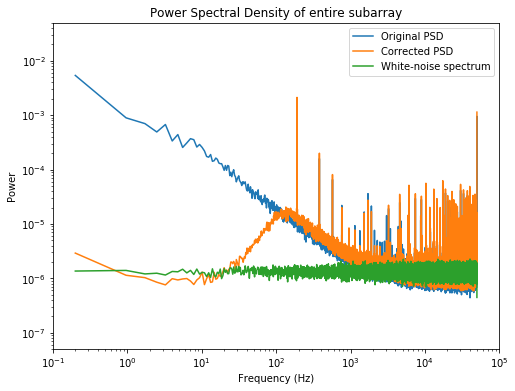

In [69]:
plt.figure(figsize=(8,6))

plt.title("Power Spectral Density of entire subarray")
plt.plot(new_frequency, psd_full,zorder=1,label ='Original PSD')
plt.plot(new_frequency, psd_corrected_full,zorder=1,label ='Corrected PSD')
plt.plot(new_frequency, psd_wn_full,zorder=1,label ='White-noise spectrum')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.xscale('log')
plt.yscale('log')
plt.legend()
plt.xlim(0.1,1e5)
plt.ylim(0.5*1e-7,0.5*1e-1)

The story kind-of-repeats itself as the "fake"-subarray cases! Column-by-column removes _some_ of the features, but not all of it.

### 5. Discussion 

It seems we now have to jump into the perhaps most complex part of this study, which is to actually _model_ this read-noise pattern. Modelling this pattern is important for various reasons:

1. If we want to simulate, e.g., hundreds of integrations to see the impact of different approaches (e.g., row-to-row or column-to-column substraction, depending on the orientation of the detector) at reducing this read-noise pattern, we need to have a "sampler" that captures the PSD of the process and lets us sample realizations from it. In principle we could use B. Rauscher's code, but the _actual_ PSD is slightly different between instruments --- and not _strictly_ 1/f, only approximately so.

2. If we want to _correct_ for this effect, modelling the process is enlightening to understand possible solutions to it.

3. If the solution to the problem is applying some sort of covariance structure at the extraction step as the NIRCam folks have suggested in their paper, then we need a fast way of computing that covariance structure --- modelling can help figuring that out.

On top of the above, we also want to hopefully model the process in the time-domain, and not on the frequency domain. The issue with the frequency domain is that although we have a good handle on the _average_ PSD of the process, it is not straightforward to compute the _correlation of the PSD_ between frequencies, nor the correlation of each frequency with itself (i.e., the variance of the PSD at each frequency). The complication arises because of the fact that we convert our data (and all of its properties) to the frequency domain --- and that conversion/mapping can impact on the statistics we compute in the frequency domain. Modelling in the time-domain, on the other hand, is straightforward, because we understand the properties of the noise in that domain much better. 

To my knowledge, there are two ways of performing likelihood-based inference on stochastic processes such as the ones observed in these read-noise patterns in the time-domain in `python`. The first is to perform this through Gaussian Processes. In particular [celerite](https://celerite2.readthedocs.io/en/latest/) ([Foreman-Mackey et al., 2017](https://iopscience.iop.org/article/10.3847/1538-3881/aa9332/meta)) or [george](https://george.readthedocs.io/en/latest/) might be good enough tools for this --- but given how big the datasets we are dealing here are, most likely _celerite_ is the only real option ([GPyTorch](https://gpytorch.ai/) might be another good alternative, but haven't played with that myself). The second approach I know of is using the 1/$f^{\alpha}$ models outlined in [Carter & Winn (2009)](https://ui.adsabs.harvard.edu/abs/2009ApJ...704...51C/abstract). I've already implemented those using the fast wavelet transform in the [pinknoise](https://github.com/nespinoza/pinknoise) library I'm developing. The problem with that approach is that in principle it only works on equally-sampled data. We could pad spaces in a time-series with zeroes (e.g., on the row-to-row jumps of the read-pattern) --- but that is a bit suboptimal. 

We perform all these analyses in Notebook 2.